# Eigendecomposition: Seeing Data Through a Different Lens

For centuries, we could only see the universe in the visible spectrum of light. As we broadened our observational window into radio and X‑ray regimes, we revealed entirely new structures that were always present, yet hidden from our “normal” view. With radio telescopes, we can now map the large‑scale distribution of neutral hydrogen and trace the cosmic web’s filaments ([CSIRO ASKAP Survey Science Projects](https://www.csiro.au/en/news/All/Articles/2023/January/askaps-survey-science-projects)) and through X‑ray vision we detect the hot intracluster gas, supernova remnants, and the energetic cores of active galaxies ([X‑ray Astronomy at JAXA](https://global.jaxa.jp/article/special/xray/index_e.html)). Observations by ALMA have even resolved the internal clumps and gas dynamics of the universe’s earliest galaxies, offering unprecedented insight into galaxy formation just one billion years after the Big Bang ([ALMA Early Science Cycle 2 Highlights](https://almascience.nrao.edu/observing/highest-priority-projects-static/cycle-2-outcome-of-the-proposal-review-process)).  


<figure style="margin: 2em 0; text-align: center;">
  <div style="display: inline-flex; justify-content: center; gap: 5em; flex-wrap: wrap;">
    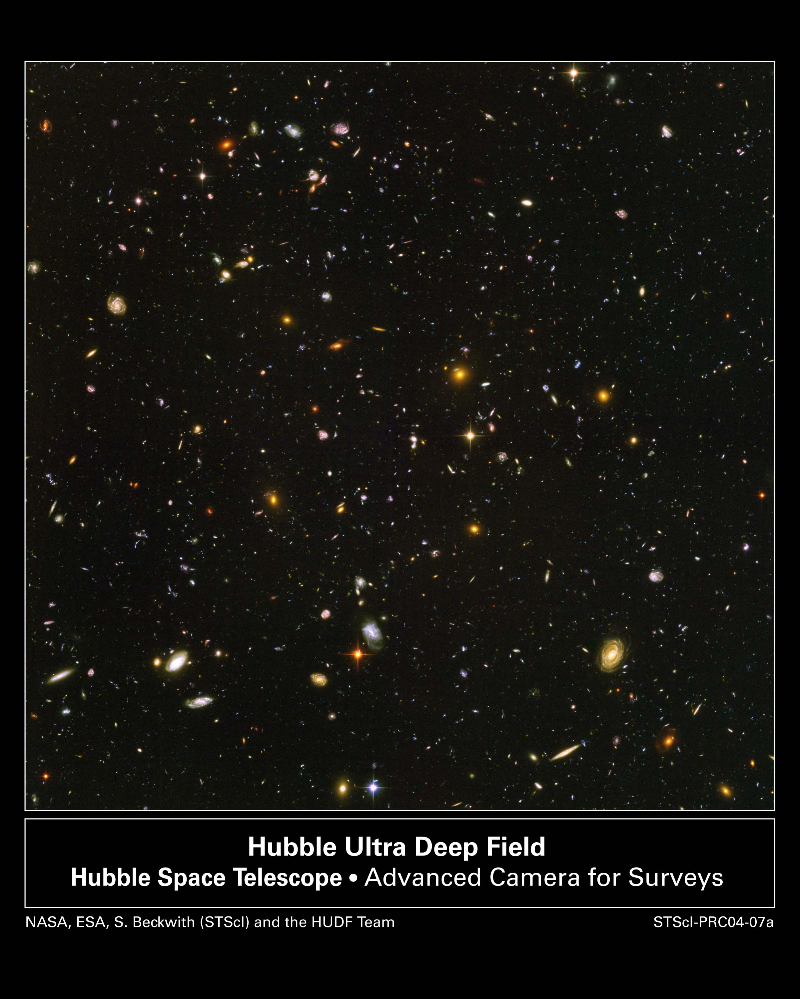
    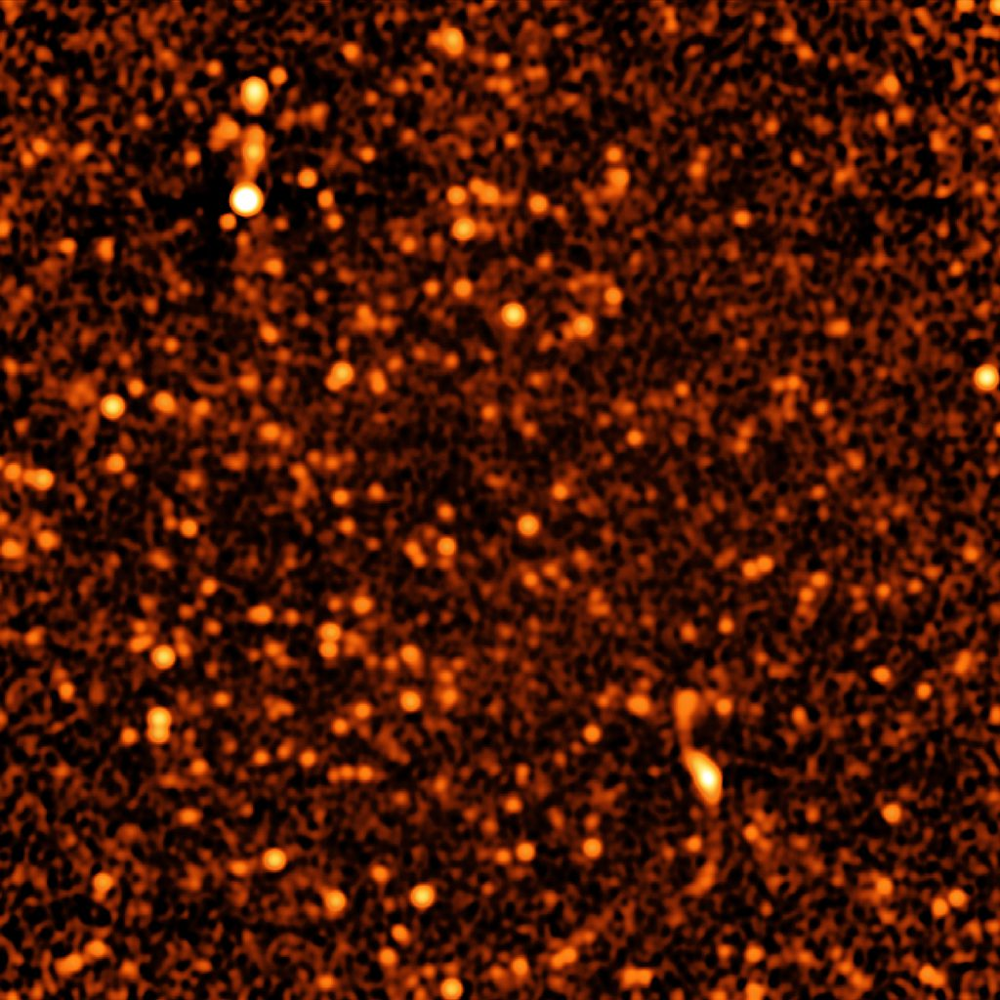
    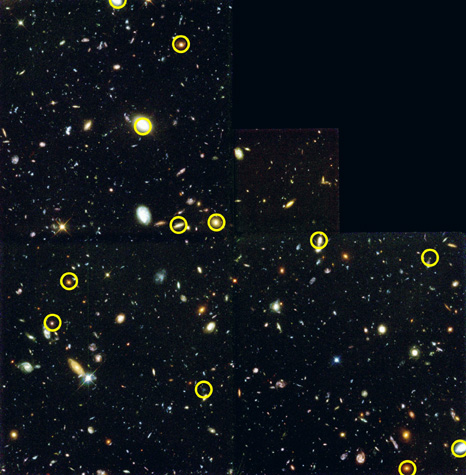
  </div>
  <figcaption style="font-size:0.9em; margin-top:0.5em; text-align: center;">
    <strong>Figure 1.</strong> Multiwavelength observations of the same extragalactic field — <strong>left panel (visible spectrum):</strong> <a href="https://esahubble.org/images/heic0611b/" target="_blank">HST Ultra Deep Field</a>; <strong>middle panel (radio spectrum):</strong> <a href="https://public.nrao.edu/gallery/vla-deep-field/" target="_blank">VLA Deep Field</a>; <strong>right panel (X‑ray spectrum):</strong> <a href="https://science.nasa.gov/asset/hubble/chandra-deep-field-north/" target="_blank">Chandra Deep Field‑North</a>.
  </figcaption>
</figure>

Sometimes our new visual abilities allow us to transform raw data into actionable insight through enhanced perception alone, and when combined across complementary modalities e.g. cameras, radar, and LiDAR, they form the basis of sensor‑fusion systems in autonomous vehicles, producing unified environment models that enhance obstacle detection and decision‑making across weather and lighting conditions, encompassing the need for new perceptions to unveil hidden patterns and dimensions within complex environments. (<a href="https://www.businessinsider.com/waymo-robotaxi-lidar-sensor-versus-cameras-vision-only-2025-5" target="_blank">Waymo’s 5 LiDAR + 6 radar + 29 camera suite</a>), (<a href="https://www.sciencedirect.com/science/article/pii/S0924271622003367" target="_blank">Perception and sensing under adverse conditions</a>), (<a href="https://medium.com/@ertugrulbgbn/how-does-teslas-autopark-feature-work-d3a67fbae43c" target="_blank">Tesla Autopark’s 8 cameras + radar hardware</a>).  

<figure style="margin: 2em 0; text-align: center;">
  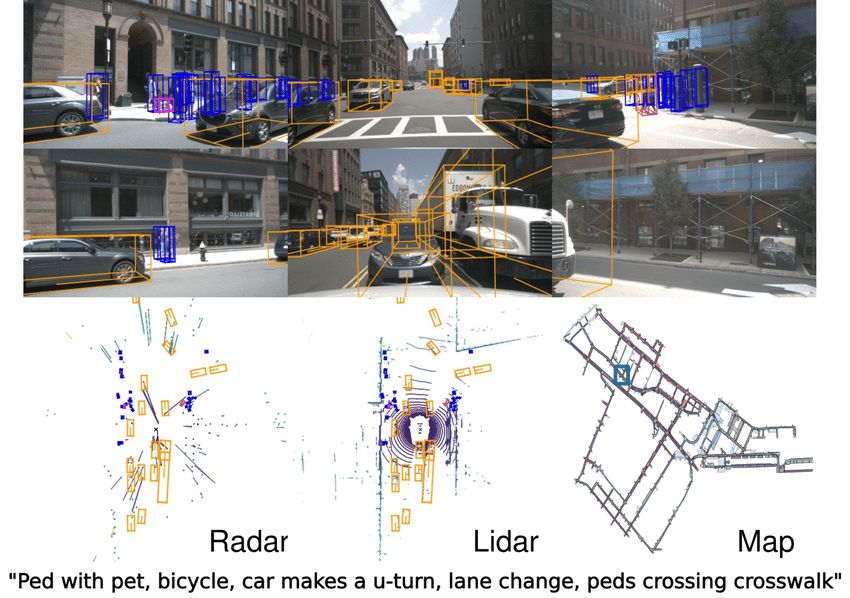
  <figcaption style="font-size:0.9em; margin-top:0.5em; text-align: center;">
    <figcaption style="font-size:0.9em; margin-top:0.5em; text-align: center;">
    <strong>Figure 2.</strong> Scene from an autonomous vehicle dataset (<a href="https://www.nuscenes.org/" target="_blank">nuScenes</a>): <strong>top row</strong> shows the actual camera views; <strong>bottom-left</strong> shows the radar Cartesian‑range heatmap; <strong>bottom-center</strong> shows the 3D LiDAR point‑cloud projection; <strong>bottom-right</strong> shows the fused map reconstruction.
  </figcaption>
</figure>


Eigen‑decomposition is like having a set of special lenses for our data: it reveals the underlying structure and primary directions of variance, powering techniques such as Spectral Clustering.


### Example - Student's Score

In [6]:
import numpy as np
import pandas as pd

students = ['A', 'B', 'C', 'D', 'E']
scores = np.array([[85, 78, 92],[70, 82, 88],[90, 75, 85],[60, 95, 80],[80, 88, 90]])
df_scores = pd.DataFrame(scores, index=students, columns=['Math', 'English', 'Science'])
df_scores


,Math,English,Science
A,85,78,92
B,70,82,88
C,90,75,85
D,60,95,80
E,80,88,90


When presented with a table of student scores across multiple subjects, our brains struggle to assess performance beyond two dimensions due to limited cognitive capacity for multidimensional comparisons ([Cognitive Load Theory](https://cft.vanderbilt.edu/guides-sub-pages/cognitive-load-theory/)). While a simple average per student may seem like a quick fix, this method falters as datasets grow and variable interactions multiply—a manifestation of [The Curse of Dimensionality](https://en.wikipedia.org/wiki/Curse_of_dimensionality) that makes high-dimensional data sparse and difficult to summarize accurately.

Computing an average via machine further assumes equal weighting across subjects ([The Problem with Averages](https://hbr.org/2016/11/the-problem-with-averages)), ignoring differences in variance and inter‑correlations that can distort true performance patterns ([Correlated Variables](https://statisticsbyjim.com/basics/correlated-variables/)). Although averaging can rank students for a basic “first‑prize” outcome, it fails to reveal which subjects posed particular challenges or capture nuanced trends over time—issues widely recognized in [Multicollinearity](https://en.wikipedia.org/wiki/Multicollinearity) literature. Instead, techniques like PCA apply eigendecomposition to standardize scales, account for correlations, and extract principal components, revealing dominant patterns and enabling deeper insights into student performance.  


#### Step 1 - Center the Data

We center each subject by subtracting its mean, then compute the 3×3 covariance matrix. Each feature has zero mean—ensuring that the covariance matrix (next step) captures only true variability and that principal components (eigenvectors of the covariance matrix) align with genuine directions of maximal variance ([Centering Matrix](https://en.wikipedia.org/wiki/Centering_matrix)), ([Covariance Matrix](https://en.wikipedia.org/wiki/Covariance_matrix)).

In [9]:
centered = df_scores - df_scores.mean()
centered

,Math,English,Science
A,8.0,-5.6,5.0
B,-7.0,-1.6,1.0
C,13.0,-8.6,-2.0
D,-17.0,11.4,-7.0
E,3.0,4.4,3.0


#### Step 2: Compute the Covariance Matrix

We then proceed to the centered data to calculate the covariance between each pair of subjects, resulting in a covariance matrix that captures how each subject’s scores jointly vary ([Covariance Matrix](https://en.wikipedia.org/wiki/Covariance_matrix)). Off‑diagonal covariances with large magnitude reveal strong linear relationships between variables, indicating clusters of related features and guiding principal components to align with these dominant patterns ([Principal Component Analysis](https://en.wikipedia.org/wiki/Principal_component_analysis))

In [11]:
cov_mat = np.cov(centered.T)
pd.DataFrame(cov_mat, index=df_scores.columns, columns=df_scores.columns)

,Math,English,Science
Math,145.00,-81.50,33.75
English,-81.50,64.30,-19.75
Science,33.75,-19.75,22.00


#### Step 3: Eigendecomposition

Next the covariance matrix is decopmposed to get eigenvalues (variance explained) and eigenvectors (principal directions). The eigen-values and -vectors generally hold the following properties -

- **Eigenvalues are real** for any real [Symmetric matrix](https://en.wikipedia.org/wiki/Symmetric_matrix), guaranteeing meaningful spectral decomposition.  
- **Eigenvalues are non‑negative** when the matrix is positive semi‑definite ([Why covariance matrix is PSD](https://statproofbook.github.io/P/covmat-psd.html)) (e.g., a covariance matrix), so they represent true variances.  
- **Eigenvectors form an orthonormal basis** for symmetric matrices, ensuring principal components are uncorrelated ([Orthogonal eigendecomposition](https://dept.math.lsa.umich.edu/~speyer/LinearAlgebraVideos/Lecture10a.pdf)).

In [17]:
cov_df = pd.DataFrame(cov_mat, index=df_scores.columns, columns=df_scores.columns)
eigen_vals, eigen_vecs = np.linalg.eig(cov_df)
order = np.argsort(eigen_vals)[::-1]
eigen_vals, eigen_vecs = eigen_vals[order], eigen_vecs[:, order]

eigvals = pd.Series(np.round(eigen_vals, 2), index=['component1', 'component2', 'component3'],  name='Eigenvalue')
eigvecs = pd.DataFrame(np.round(eigen_vecs, 3), index=cov_df.index, columns=eigvals.index)

print(eigvals)
eigvecs


component1    203.99
component2     14.65
component3     12.66
Name: Eigenvalue, dtype: float64


,component1,component2,component3
Math,-0.831,0.259,0.492
English,0.515,0.693,0.505
Science,-0.210,0.673,-0.709


- **Eigenvalues:**  
  - **component1 (203.99):** explains ~88.2 % of total variance, identifying the dominant axis of variation.  
  - **component2 (14.65):** captures ~6.3 % of variance, revealing a secondary pattern.  
  - **component3 (12.66):** accounts for ~5.5 % of variance, indicating minor residual structure.

<br>

- **Eigenvectors (Loadings):**  
  - **component1:** Math (–0.831), English (0.515), Science (–0.210) – reflects an “overall performance” axis driven primarily by Math with contributions from English and Science.  
  - **component2:** Math (0.259), English (0.693), Science (0.673) – highlights joint variation in English and Science distinct from Math.  
  - **component3:** Math (0.492), English (0.505), Science (–0.709) – contrasts Science inversely with Math and English, capturing a subject‑balance trade‑off.

<br>

The analysis reveals one overwhelmingly dominant pattern (component1) that explains the vast majority of the data's variance (Eigenvalue ≈ 204). This main component primarily represents a strong trade-off between student abilities, where high scores in English are strongly correlated with low scores in Math.



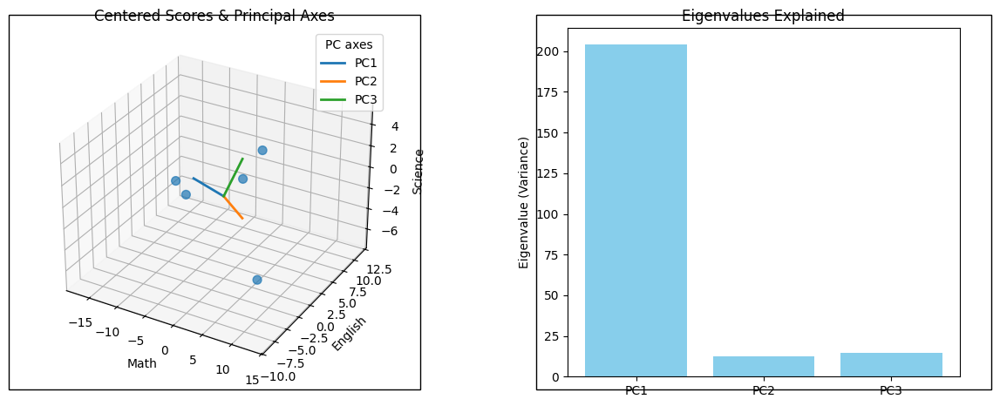

In [39]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import io, base64
from mpl_toolkits.mplot3d import Axes3D
from IPython.display import HTML, display

# -- Mock data for a runnable example --
students = ['A', 'B', 'C', 'D', 'E']
scores = np.array([
    [85, 78, 92], [70, 82, 88], [90, 75, 85], [60, 95, 80], [80, 88, 90]
])
df_scores = pd.DataFrame(scores, index=students, columns=['Math', 'English', 'Science'])
centered = df_scores - df_scores.mean()
cov_matrix = np.cov(centered.T)
eigen_vals, eigen_vecs = np.linalg.eig(cov_matrix)
# -- End of mock data --

# Create the figure and axes
fig = plt.figure(figsize=(12, 5)) # Made figure wider to accommodate space
ax1 = fig.add_subplot(121, projection='3d')
ax2 = fig.add_subplot(122)

# Left: 3D scatter
ax1.scatter(centered['Math'], centered['English'], centered['Science'], s=50, alpha=0.7)
origin = [0, 0, 0]
for i, (val, vec) in enumerate(zip(eigen_vals, eigen_vecs.T), start=1):
    ax1.plot(
        [origin[0], vec[0] * np.sqrt(val)],
        [origin[1], vec[1] * np.sqrt(val)],
        [origin[2], vec[2] * np.sqrt(val)],
        label=f'PC{i}', linewidth=2
    )
ax1.set_xlabel('Math')
ax1.set_ylabel('English')
ax1.set_zlabel('Science')
ax1.legend(title='PC axes')
ax1.set_title('Centered Scores & Principal Axes')

# Right: eigenvalue bar chart
components = [f'PC{i}' for i in range(1, len(eigen_vals) + 1)]
ax2.bar(components, eigen_vals, color='skyblue')
ax2.set_ylabel('Eigenvalue (Variance)')
ax2.set_title('Eigenvalues Explained')

fig.subplots_adjust(left=0.05, right=0.95, top=0.9, bottom=0.1, wspace=0.4)


# --- FIX 2: Increase box dimensions using padding ---
padding = 0.03 # Padding in figure-normalized coordinates
for ax in fig.axes:
    pos = ax.get_position()
    # Calculate padded position and dimensions
    padded_pos = [pos.x0 - padding, pos.y0 - padding]
    padded_width = pos.width + (2 * padding)
    padded_height = pos.height + (2 * padding)
    
    rect = patches.Rectangle(
        padded_pos, padded_width, padded_height,
        transform=fig.transFigure,
        edgecolor='black',
        linewidth=1,
        facecolor='none',
        clip_on=False
    )
    fig.add_artist(rect)
# --- End of fixes ---

# Save the figure to a buffer
buf = io.BytesIO()
fig.savefig(buf, format='png', bbox_inches='tight', pad_inches=0.1)
buf.seek(0)
img_b64 = base64.b64encode(buf.read()).decode('utf-8')
plt.close(fig)

# Display in HTML
html = f"""
<figure style="text-align:center; margin:2em 0;">
  <img src="data:image/png;base64,{img_b64}" style="max-width:100%; height:auto;" />
  <figcaption style="font-size:0.9em; margin-top:0.5em;">
    <strong>Figure:</strong> The two subplots now have increased spacing between them and larger bounding boxes with more padding.
  </figcaption>
</figure>
"""
display(HTML(html))

In [26]:
from IPython.display import HTML, display

html = f"""
<figure style="margin:2em 0;">
  <div style="display:flex; gap:2em; align-items:flex-start;">
    <div style="border:1px solid #444; padding:1em; border-radius:4px; width:45%;">
      <h4 style="margin-top:0; text-align:center;">Raw Scores</h4>
      {centered.to_html()}
    </div>
    <div style="border:1px solid #444; padding:1em; border-radius:4px; width:45%;">
      <h4 style="margin-top:0; text-align:center;">Eigen‑Lens</h4>
      <strong>Eigenvalues</strong><br>{eigvals.to_frame().to_html()}
      <strong>Eigenvectors</strong><br>{eigvecs.to_html()}
    </div>
  </div>
  <figcaption style="text-align:center; font-size:0.9em; margin-top:0.5em;">
    <strong>Figure 3.</strong> Side-by-side comparison of the centered student scores (left) and their PCA eigendecomposition—eigenvalues and eigenvectors (right).
  </figcaption>
</figure>
"""
display(HTML(html))


This figure juxtaposes the centered score table with its eigendecomposition—showing on the left the raw, zero‑mean data and on the right the eigenvalues (quantifying variance) alongside eigenvectors (the principal directions)—offering two complementary “lenses” on the same underlying information, much like optical versus radio telescopes in astronomy or camera, radar, and LiDAR sensors in autonomous vehicles revealing different views of the same scene.


## Use Cases

#### Data Analysis & Machine Learning  
Dimensionality‑reduction and clustering methods use eigenvalues to uncover the most informative directions in high‑dimensional data, making large datasets interpretable and actionable.  

- [Principal Component Analysis](https://en.wikipedia.org/wiki/Principal_component_analysis)  
- [Spectral Clustering](https://en.wikipedia.org/wiki/Spectral_clustering)  
- [Image Compression via SVD](https://en.wikipedia.org/wiki/Singular_value_decomposition#Applications)  

#### Graph & Network Analysis  
Eigen‑based techniques reveal hidden structure and importance in graphs, from web‑page ranking to electrical‑network decoupling.  

- [PageRank](https://en.wikipedia.org/wiki/PageRank)  
- [Markov Chains](https://en.wikipedia.org/wiki/Markov_chain#Stationary_distributions)  
- [Symmetrical Components Transformation](https://en.wikipedia.org/wiki/Symmetrical_components_transformation)  

#### Engineering & Physics  
Mechanical and physical systems rely on eigenvalues to identify natural frequencies, principal axes, and failure modes, enabling design optimization and safety analyses.  

- [Vibration Analysis](https://en.wikipedia.org/wiki/Vibration)  
- [Stress Tensor Analysis](https://en.wikipedia.org/wiki/Stress_(mechanics))  
- [Moment of Inertia](https://en.wikipedia.org/wiki/Moment_of_inertia#Principal_axes)  
- [Schrödinger Equation](https://en.wikipedia.org/wiki/Schrödinger_equation)  

#### Computer Vision  
Feature‑detection algorithms extract corners and textures by examining eigenvalues of local gradient matrices, improving image understanding.  

- [Harris Corner Detection](https://en.wikipedia.org/wiki/Harris_corner_detector)  

#### Finance  
Risk‑modeling and portfolio analysis use PCA’s eigenvalues to identify dominant factors driving market variability and optimize asset allocations.  

- [Risk Factor Analysis](https://en.wikipedia.org/wiki/Risk_factor_(finance))  
